In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
import pandas_profiling 
from numpy import argmax
import itertools
%matplotlib inline
sns.set(color_codes=True)

# setting up plot style 
#style.use('seaborn-poster')
#style.use('fivethirtyeight')

from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.naive_bayes import GaussianNB
import statsmodels.formula.api as SM
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import fbeta_score

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

# PART ONE - HEALTHCARE

## 1. Import and warehouse data:

In [29]:
df_normal = pd.read_csv('Part1 - Normal.csv')
df_S = pd.read_csv('Part1 - Type_S.csv')
df_H = pd.read_csv('Part1 - Type_H.csv')

In [30]:
df_normal.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal


In [31]:
df_normal.shape

(100, 7)

In [32]:
df_S 

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,74.377678,32.053104,78.772013,42.324573,143.560690,56.125906,Type_S
1,89.680567,32.704435,83.130732,56.976132,129.955476,92.027277,Type_S
2,44.529051,9.433234,52.000000,35.095817,134.711772,29.106575,Type_S
3,77.690577,21.380645,64.429442,56.309932,114.818751,26.931841,Type_S
4,76.147212,21.936186,82.961502,54.211027,123.932010,10.431972,Type_S
...,...,...,...,...,...,...,...
145,80.111572,33.942432,85.101608,46.169139,125.593624,100.292107,Type_S
146,95.480229,46.550053,59.000000,48.930176,96.683903,77.283072,Type_S
147,74.094731,18.823727,76.032156,55.271004,128.405731,73.388216,Type_S
148,87.679087,20.365613,93.822416,67.313473,120.944829,76.730629,Type_S


In [33]:
df_H.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,Type_H
1,39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,Type_H
2,68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,Type_H
3,69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,Type_H
4,49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,Type_H


In [34]:
df_H.shape

(60, 7)

### Final merged Dataframe

In [35]:
df = pd.concat([df_normal, df_S, df_H], axis = 0)
df = df.reset_index()
df = df.drop('index',axis=1)
df

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal
...,...,...,...,...,...,...,...
305,47.657730,13.277385,36.679985,34.380345,98.249781,6.273012,Type_H
306,43.349606,7.467469,28.065483,35.882137,112.776187,5.753277,Type_H
307,46.855781,15.351514,38.000000,31.504267,116.250917,1.662706,Type_H
308,43.203185,19.663146,35.000000,23.540039,124.846109,-2.919076,Type_H


In [36]:
df.shape

(310, 7)

## 2. Data Cleansing:

### Correct Datatypes

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 310 entries, 0 to 309
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   P_incidence  310 non-null    float64
 1   P_tilt       310 non-null    float64
 2   L_angle      310 non-null    float64
 3   S_slope      310 non-null    float64
 4   P_radius     310 non-null    float64
 5   S_Degree     310 non-null    float64
 6   Class        310 non-null    object 
dtypes: float64(6), object(1)
memory usage: 17.1+ KB


In [38]:
df.isnull().sum()

P_incidence    0
P_tilt         0
L_angle        0
S_slope        0
P_radius       0
S_Degree       0
Class          0
dtype: int64

In [39]:
df['Class'].value_counts()

Type_S    133
Normal     73
Type_H     37
Nrmal      27
type_h     23
tp_s       17
Name: Class, dtype: int64

In [40]:
def Class(x):
    if x == 'Nrmal':
        x = 'Normal'
    elif x == 'type_h':
        x = 'Type_H'
    elif x == 'tp_s':
        x = 'Type_S'
    return x

In [41]:
df['Class'] = df['Class'].apply(Class)
df

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal
...,...,...,...,...,...,...,...
305,47.657730,13.277385,36.679985,34.380345,98.249781,6.273012,Type_H
306,43.349606,7.467469,28.065483,35.882137,112.776187,5.753277,Type_H
307,46.855781,15.351514,38.000000,31.504267,116.250917,1.662706,Type_H
308,43.203185,19.663146,35.000000,23.540039,124.846109,-2.919076,Type_H


In [42]:
df['Class'].value_counts()

Type_S    150
Normal    100
Type_H     60
Name: Class, dtype: int64

## 3. Data analysis & visualisation

In [16]:
df.describe()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
count,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000
mean,60.496653,17.542822,51.930930,42.953831,117.920655,26.296694
std,17.236520,10.008330,18.554064,13.423102,13.317377,37.559027
min,26.147921,-6.554948,14.000000,13.366931,70.082575,-11.058179
25%,46.430294,10.667069,37.000000,33.347122,110.709196,1.603727
50%,58.691038,16.357689,49.562398,42.404912,118.268178,11.767934
75%,72.877696,22.120395,63.000000,52.695888,125.467674,41.287352
max,129.834041,49.431864,125.742385,121.429566,163.071041,418.543082


### Outlier Check

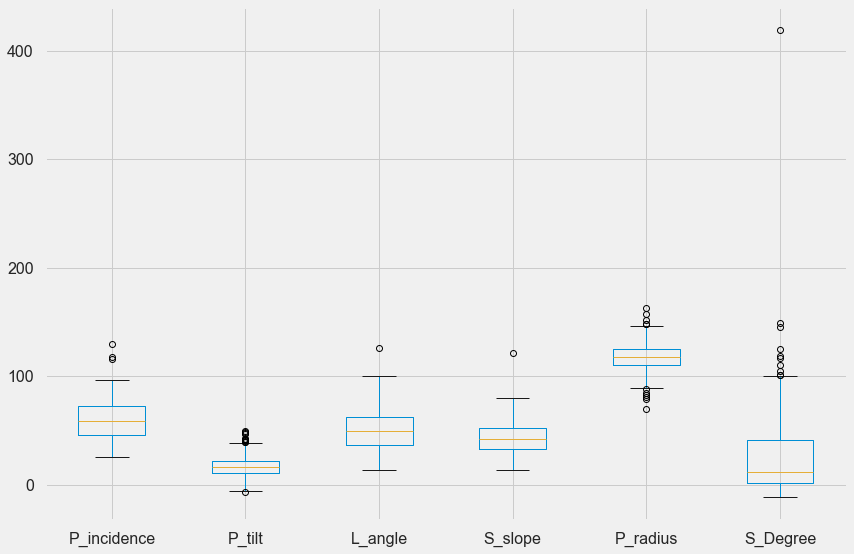

In [24]:
style.use('seaborn-poster')
style.use('fivethirtyeight')
df.boxplot()

#### From the above box plots we see that L_angle and S_slope columns have the least outliers.

### Distribution of the numerical cols

In [18]:
df_num = df[['P_incidence', 'P_tilt', 'L_angle', 'S_slope', 'P_radius', 'S_Degree']]

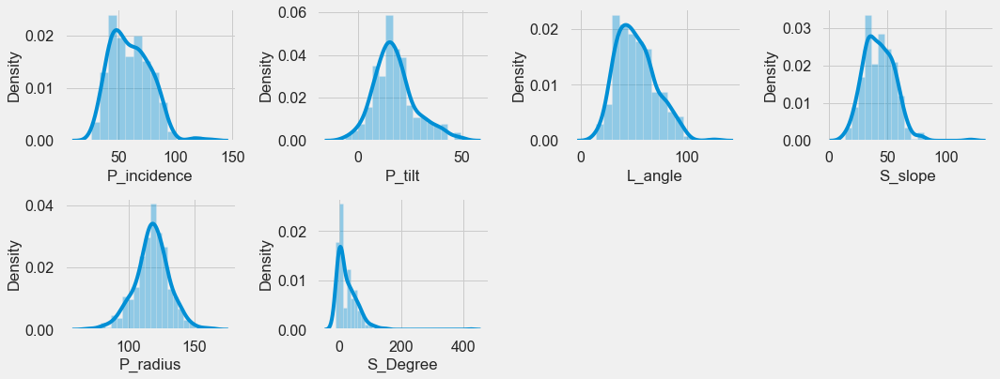

In [19]:
fig = plt.figure(figsize = (15, 8))
for i in range(0, len(df_num.columns)):
    ax = fig.add_subplot(3, 4, i+1)
    sns.distplot(df_num[df_num.columns[i]])
    plt.tight_layout()


#### From the Distribuition plots above we see that most even distribuition is for P_tilt column and P_radius columns

### Total Count of Classes

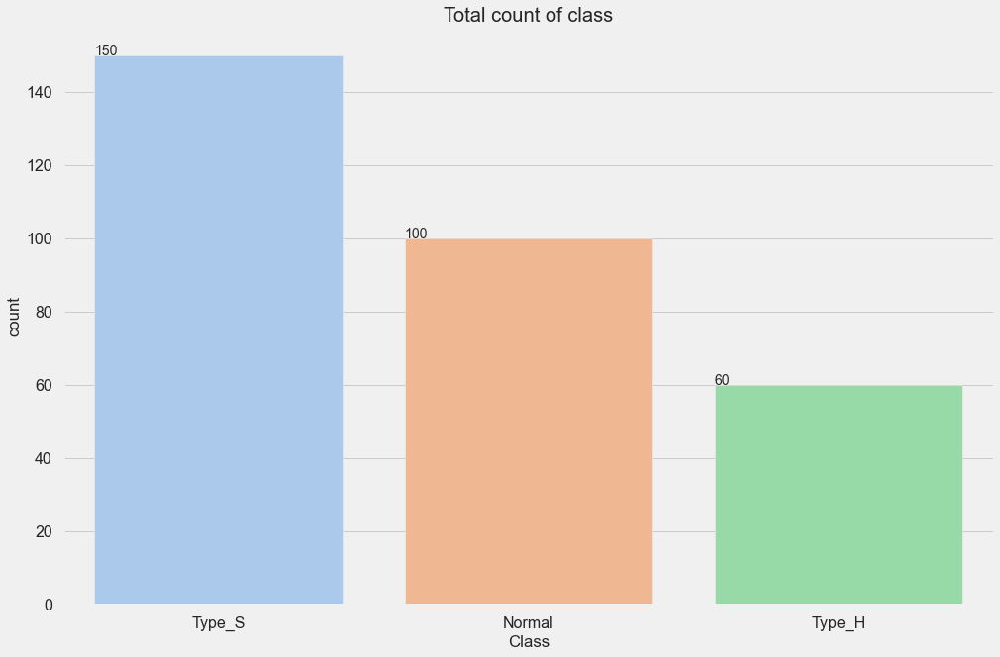

In [20]:
# Count of Class.
plt.figure(figsize=(15,10))
sns.set_palette("pastel")
ax = sns.countplot(x="Class", data=df, 
                   order = df['Class'].value_counts().index)
plt.title('Total count of class')
for p in ax.patches:
        ax.annotate('{:}'.format(p.get_height()), (p.get_x(), p.get_height()))

#### From the above count plot we see that Type_S Class has the highest count of 150 and Type_H has the lowest 60

### Pair Plot for classification of classes

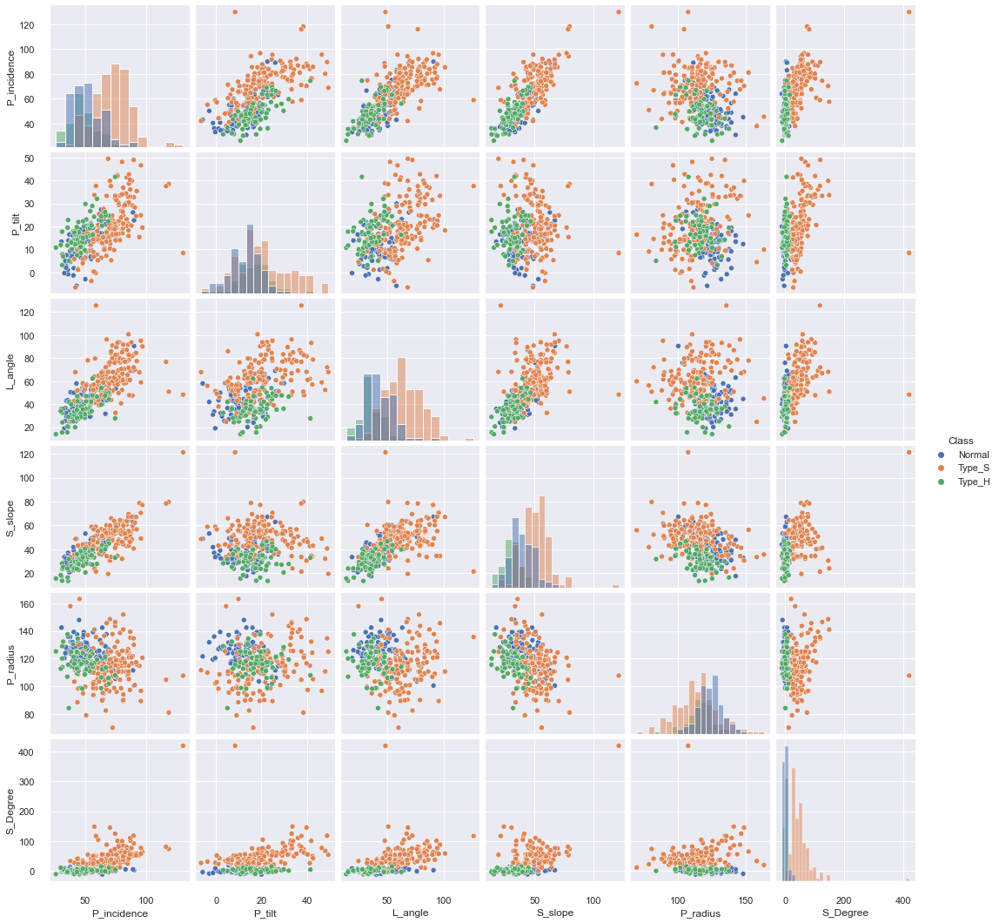

In [59]:
# Pair Plot
sns.pairplot(df,diag_kind='hist',hue='Class')

#### From the pair plot we see that there is almost some linearity between L_angle and P_incidence, S_Slope and P_incidence, S_slope and L_angle.

### Bar Plot for classification of classes

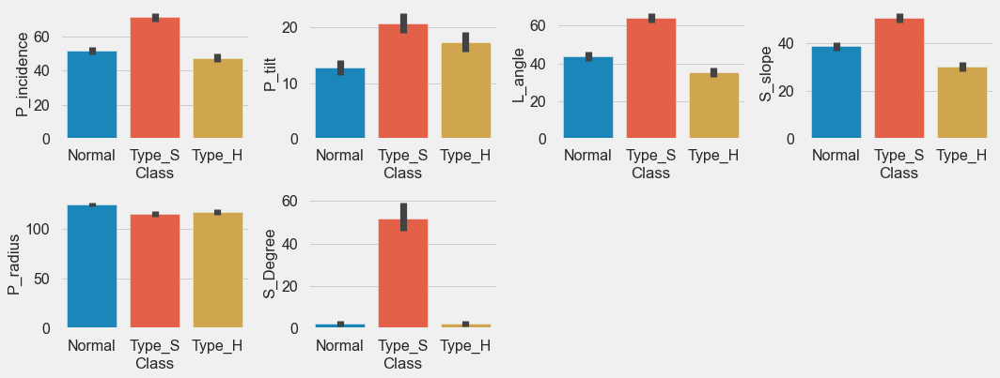

In [27]:
fig = plt.figure(figsize = (15, 8))
for i in range(0, len(df_num.columns)):
    ax = fig.add_subplot(3, 4, i+1)
    sns.barplot(df['Class'], df_num[df_num.columns[i]])
    plt.tight_layout()

#### From the bar plots we see that we have P_radius column which has highest classification with Class

### Checking correlation

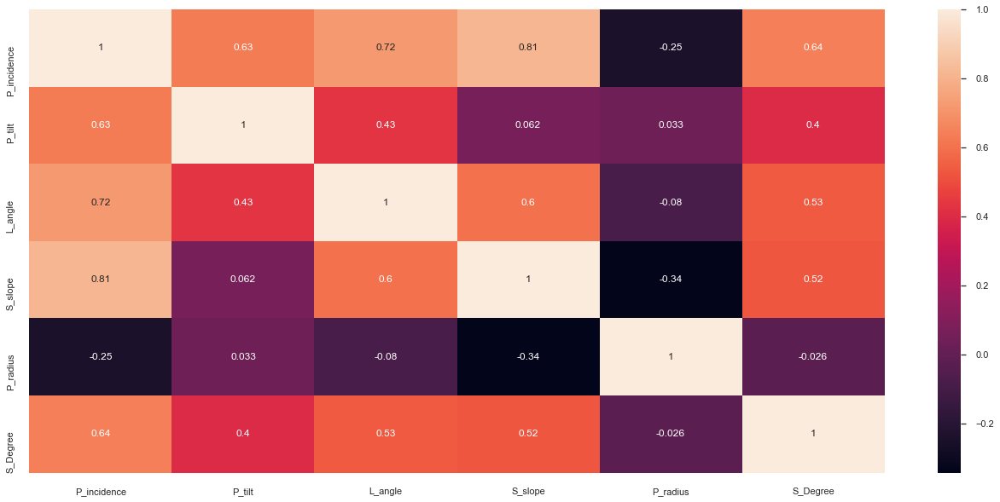

In [33]:
plt.figure(figsize= (20,10))
sns.heatmap(df_num.corr(), annot= True)
plt.show()

#### From the above heat map we see that S_slope and P_incidence, L_angle and P_incidence are highly correlated.

### Pandas Profiling

In [43]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/20 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [44]:
pandas_profiling.ProfileReport(df).to_file(output_file='Healthcare.html')

Summarize dataset:   0%|          | 0/20 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 4. Data pre-processing:
### Segregate predictors vs target attributes

In [37]:
# Transform data into features and target
X = df.drop('Class', axis=1)
Y = df['Class']

In [38]:
X

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910
...,...,...,...,...,...,...
305,47.657730,13.277385,36.679985,34.380345,98.249781,6.273012
306,43.349606,7.467469,28.065483,35.882137,112.776187,5.753277
307,46.855781,15.351514,38.000000,31.504267,116.250917,1.662706
308,43.203185,19.663146,35.000000,23.540039,124.846109,-2.919076


In [39]:
Y

0      Normal
1      Normal
2      Normal
3      Normal
4      Normal
        ...  
305    Type_H
306    Type_H
307    Type_H
308    Type_H
309    Type_H
Name: Class, Length: 310, dtype: object

### Perform normalisation or scaling if required.

In [40]:
from sklearn.preprocessing import StandardScaler

In [41]:
X_std = pd.DataFrame(StandardScaler().fit_transform(X))
X_std.columns = X.columns
X_std

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
0,-1.277922,-0.057898,-0.907904,-1.597803,0.730468,-0.488288
1,-0.324010,0.142672,-0.017786,-0.522437,0.596124,-0.647896
2,-0.937559,-0.860412,-0.271475,-0.562386,0.849889,-0.568091
3,-0.707649,-0.009077,-0.212206,-0.901920,0.831811,-0.725568
4,-0.859732,-0.688835,-0.504914,-0.590377,0.921914,-0.791650
...,...,...,...,...,...,...
305,-0.746072,-0.426878,-0.823302,-0.639744,-1.479471,-0.533988
306,-0.996417,-1.008324,-1.288345,-0.527682,-0.386922,-0.547848
307,-0.792673,-0.219302,-0.752043,-0.854354,-0.125583,-0.656934
308,-1.004926,0.212198,-0.913994,-1.448635,0.520872,-0.779120


In [42]:
df_new = X_std.copy()
df_new

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
0,-1.277922,-0.057898,-0.907904,-1.597803,0.730468,-0.488288
1,-0.324010,0.142672,-0.017786,-0.522437,0.596124,-0.647896
2,-0.937559,-0.860412,-0.271475,-0.562386,0.849889,-0.568091
3,-0.707649,-0.009077,-0.212206,-0.901920,0.831811,-0.725568
4,-0.859732,-0.688835,-0.504914,-0.590377,0.921914,-0.791650
...,...,...,...,...,...,...
305,-0.746072,-0.426878,-0.823302,-0.639744,-1.479471,-0.533988
306,-0.996417,-1.008324,-1.288345,-0.527682,-0.386922,-0.547848
307,-0.792673,-0.219302,-0.752043,-0.854354,-0.125583,-0.656934
308,-1.004926,0.212198,-0.913994,-1.448635,0.520872,-0.779120


In [43]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df_new['class'] = le.fit_transform(Y)
df_new

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,class
0,-1.277922,-0.057898,-0.907904,-1.597803,0.730468,-0.488288,0
1,-0.324010,0.142672,-0.017786,-0.522437,0.596124,-0.647896,0
2,-0.937559,-0.860412,-0.271475,-0.562386,0.849889,-0.568091,0
3,-0.707649,-0.009077,-0.212206,-0.901920,0.831811,-0.725568,0
4,-0.859732,-0.688835,-0.504914,-0.590377,0.921914,-0.791650,0
...,...,...,...,...,...,...,...
305,-0.746072,-0.426878,-0.823302,-0.639744,-1.479471,-0.533988,1
306,-0.996417,-1.008324,-1.288345,-0.527682,-0.386922,-0.547848,1
307,-0.792673,-0.219302,-0.752043,-0.854354,-0.125583,-0.656934,1
308,-1.004926,0.212198,-0.913994,-1.448635,0.520872,-0.779120,1


In [45]:
df_new['class'].value_counts()

2    150
0    100
1     60
Name: class, dtype: int64

In [46]:
df_new[df_new['class'] == 0]

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,class
0,-1.277922,-0.057898,-0.907904,-1.597803,0.730468,-0.488288,0
1,-0.324010,0.142672,-0.017786,-0.522437,0.596124,-0.647896,0
2,-0.937559,-0.860412,-0.271475,-0.562386,0.849889,-0.568091,0
3,-0.707649,-0.009077,-0.212206,-0.901920,0.831811,-0.725568,0
4,-0.859732,-0.688835,-0.504914,-0.590377,0.921914,-0.791650,0
...,...,...,...,...,...,...,...
95,-0.731786,-0.392921,-0.860010,-0.646718,-0.035469,-0.814491,0
96,-0.381197,0.318116,-1.225991,-0.726682,-0.267362,-0.712503,0
97,0.055201,0.515618,-0.310977,-0.313564,0.582893,-0.773488,0
98,-0.885823,-0.885660,-0.558613,-0.477128,0.047021,-0.695548,0


In [47]:
df_new[df_new['class'] == 1]

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,class
250,0.147086,0.501369,-0.665177,-0.184950,-1.447647,-0.708059,1
251,-1.245864,-0.748769,-1.453001,-1.041521,-0.264385,-0.579556,1
252,0.484370,0.467932,-0.099262,0.273083,-0.897686,-0.795421,1
253,0.511390,0.711562,-0.411339,0.126128,-1.207303,-0.402288,1
254,-0.626648,-0.789693,-1.274745,-0.215876,-0.733455,-0.490106,1
...,...,...,...,...,...,...,...
305,-0.746072,-0.426878,-0.823302,-0.639744,-1.479471,-0.533988,1
306,-0.996417,-1.008324,-1.288345,-0.527682,-0.386922,-0.547848,1
307,-0.792673,-0.219302,-0.752043,-0.854354,-0.125583,-0.656934,1
308,-1.004926,0.212198,-0.913994,-1.448635,0.520872,-0.779120,1


In [48]:
df_new[df_new['class'] == 2]

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,class
100,0.806628,1.452165,1.448981,-0.046954,1.928420,0.795480,2
101,1.695882,1.517349,1.684280,1.046328,0.905154,1.752890,2
102,-0.927880,-0.811594,0.003729,-0.586356,1.262881,0.074933,2
103,0.999142,0.384083,0.674716,0.996617,-0.233298,0.016938,2
104,0.909456,0.439680,1.675145,0.839999,0.452122,-0.423077,2
...,...,...,...,...,...,...,...
245,1.139826,1.641245,1.790676,0.239923,0.577094,1.973295,2
246,2.032901,2.902995,0.381614,0.445948,-1.597243,1.359695,2
247,0.790186,0.128191,1.301073,0.919094,0.788596,1.255828,2
248,1.579575,0.282500,2.261457,1.817689,0.227452,1.344962,2


### Segregate predictors vs target attributes again post standardization.

In [50]:
from sklearn.model_selection import train_test_split

In [52]:
X1 = df_new.drop('class', axis=1)
Y1 = df_new['class']

In [115]:
X1

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
0,-1.277922,-0.057898,-0.907904,-1.597803,0.730468,-0.488288
1,-0.324010,0.142672,-0.017786,-0.522437,0.596124,-0.647896
2,-0.937559,-0.860412,-0.271475,-0.562386,0.849889,-0.568091
3,-0.707649,-0.009077,-0.212206,-0.901920,0.831811,-0.725568
4,-0.859732,-0.688835,-0.504914,-0.590377,0.921914,-0.791650
...,...,...,...,...,...,...
305,-0.746072,-0.426878,-0.823302,-0.639744,-1.479471,-0.533988
306,-0.996417,-1.008324,-1.288345,-0.527682,-0.386922,-0.547848
307,-0.792673,-0.219302,-0.752043,-0.854354,-0.125583,-0.656934
308,-1.004926,0.212198,-0.913994,-1.448635,0.520872,-0.779120


In [54]:
Y1

0      0
1      0
2      0
3      0
4      0
      ..
305    1
306    1
307    1
308    1
309    1
Name: class, Length: 310, dtype: int64

### Check for target balancing.

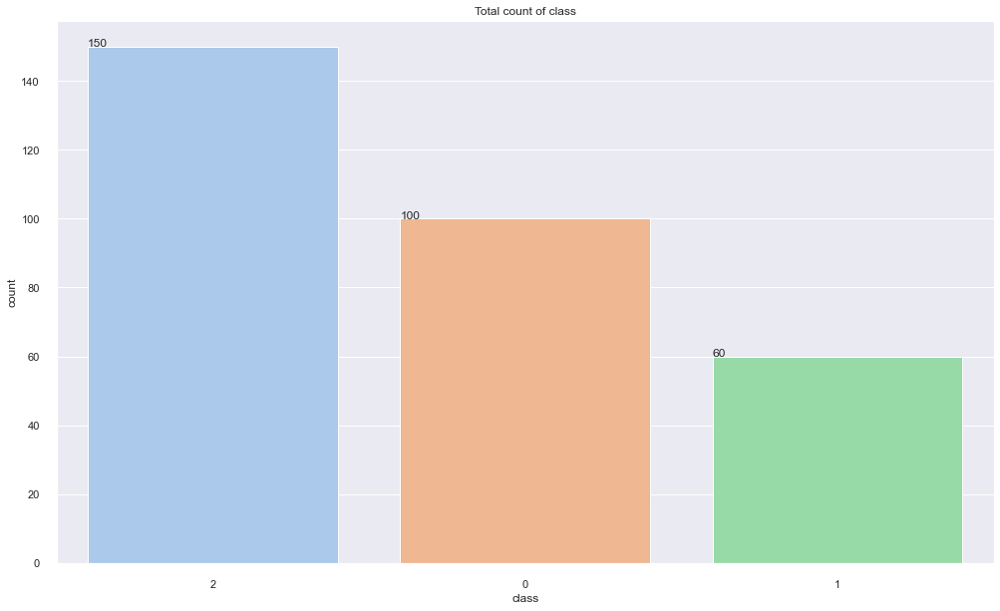

In [111]:
# Count of Class.
plt.figure(figsize=(15,10))
sns.set_palette("pastel")
ax = sns.countplot(x="class", data=df_new, 
                   order = df_new['class'].value_counts().index)
plt.title('Total count of class')
for p in ax.patches:
        ax.annotate('{:}'.format(p.get_height()), (p.get_x(), p.get_height()))

#### We can see that Class 2 has maximun count and Class 1 has least count 

### Applying SMOTE to balance all the three classes.

In [114]:
from imblearn.over_sampling import SMOTE

In [116]:
oversample = SMOTE()
X2,Y2 = oversample.fit_resample(X1, Y1)

In [117]:
X2

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
0,-1.277922,-0.057898,-0.907904,-1.597803,0.730468,-0.488288
1,-0.324010,0.142672,-0.017786,-0.522437,0.596124,-0.647896
2,-0.937559,-0.860412,-0.271475,-0.562386,0.849889,-0.568091
3,-0.707649,-0.009077,-0.212206,-0.901920,0.831811,-0.725568
4,-0.859732,-0.688835,-0.504914,-0.590377,0.921914,-0.791650
...,...,...,...,...,...,...
445,-0.408339,0.163032,-0.989081,-0.645903,0.178921,-0.585150
446,-1.712462,-0.832242,-1.312882,-1.578438,-0.337013,-0.519570
447,0.263518,0.712257,-0.019430,-0.192680,-0.591759,-0.524478
448,-1.015967,0.017767,-1.557661,-1.317845,0.021975,-0.609508


In [118]:
Y2

0      0
1      0
2      0
3      0
4      0
      ..
445    1
446    1
447    1
448    1
449    1
Name: class, Length: 450, dtype: int64

In [123]:
Y2.value_counts()

0    150
2    150
1    150
Name: class, dtype: int64

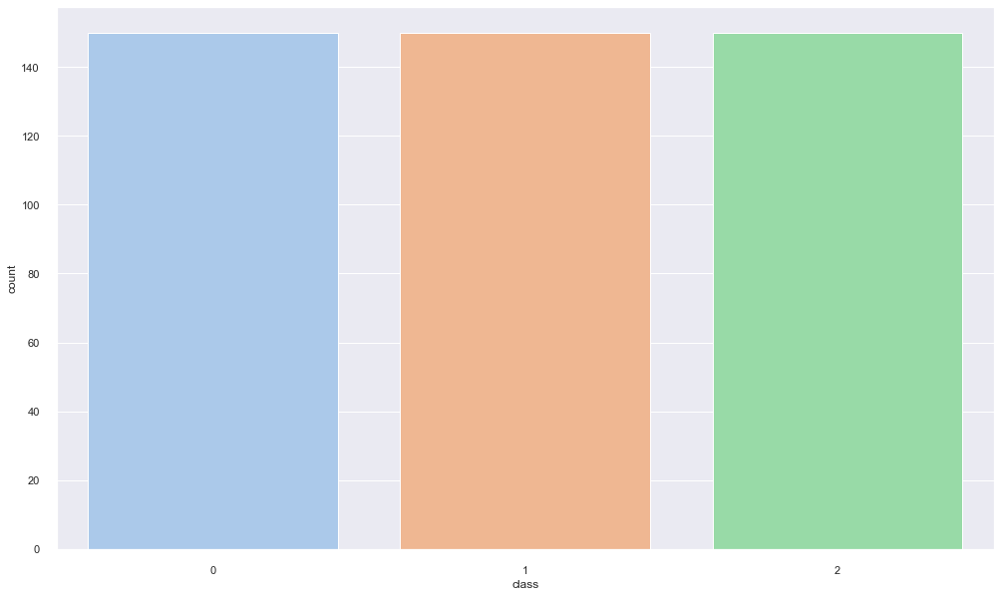

In [122]:
plt.figure(figsize=(15,10))
sns.countplot(Y2)
plt.show()

### Perform train-test split.

In [124]:
X_train, X_test, Y_train, Y_test = train_test_split(X2, Y2, 
                                                    test_size = 0.30, random_state = 42,stratify = Y2)

In [125]:
print('X_train ', X_train.shape)
print('X_test ', X_test.shape)
print('Y_train ', Y_train.shape)
print('Y_test ', Y_test.shape)

X_train  (315, 6)
X_test  (135, 6)
Y_train  (315,)
Y_test  (135,)


In [127]:
print(Y2.mean(), Y_train.mean(), Y_test.mean())

1.0 1.0 1.0


## 5. Model training, testing and tuning:

In [128]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score

### K Nearest Neighbors Classifier

### Instantiate learning model (k = 3)

In [129]:
knn = KNeighborsClassifier(n_neighbors = 3)

# fitting the model
knn.fit(X_train, Y_train)

# predict the test response
Y_pred_test = knn.predict(X_test)

In [130]:
# predict the test response
Y_pred_train = knn.predict(X_train)

In [131]:
# evaluate test accuracy
print(accuracy_score(Y_test, Y_pred_test))

0.8296296296296296


In [132]:
# evaluate train accuracy
print(accuracy_score(Y_train, Y_pred_train))

0.9333333333333333


### We have high amount of overfitting.

### Confusion Matrix for Knn with k = 3 on TRAIN data

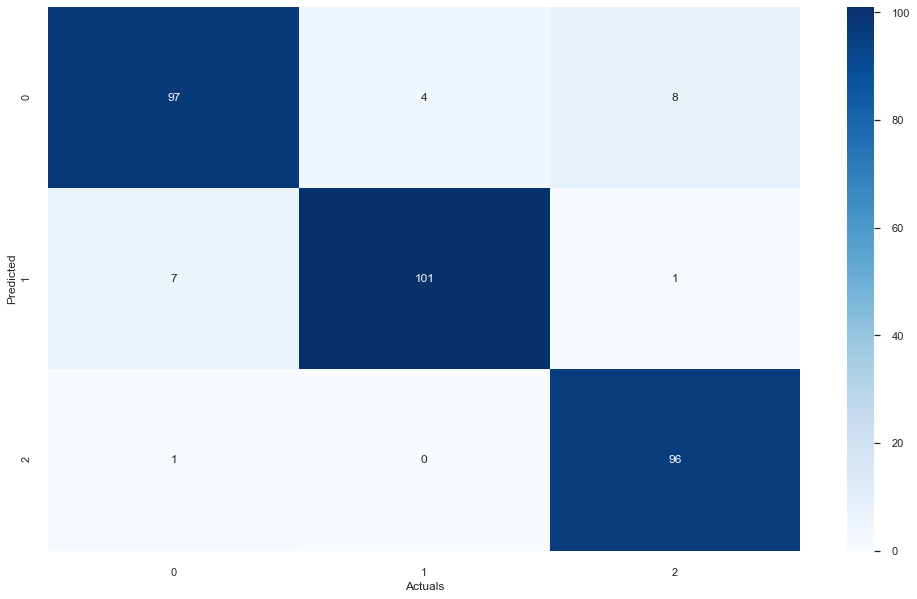

In [133]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_pred_train,Y_train)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Confusion Matrix for Knn with k = 3 on TEST data

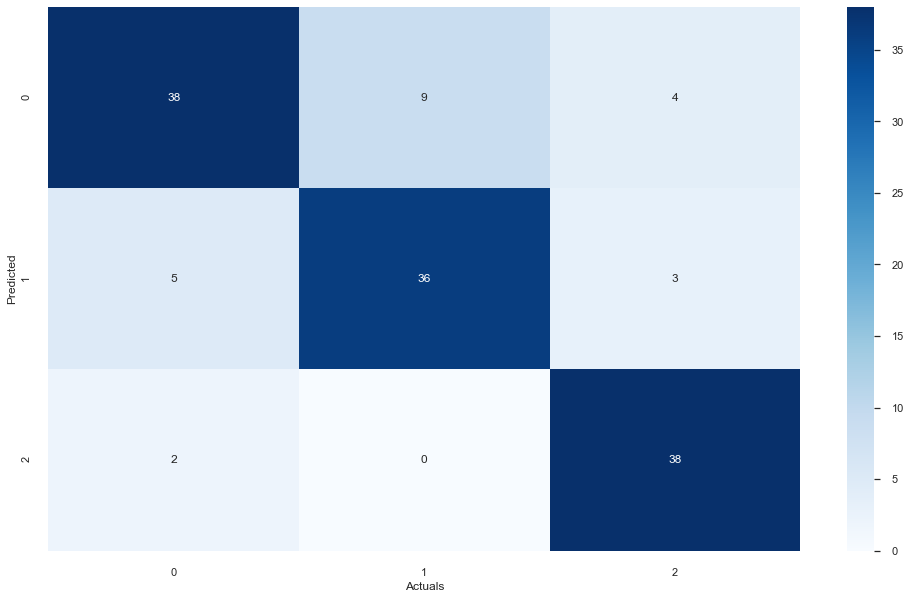

In [134]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_pred_test,Y_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Classification Report for KNN with k = 3 on training data

In [135]:
from sklearn.metrics import classification_report
print(classification_report(Y_train, Y_pred_train,digits=3))

              precision    recall  f1-score   support

           0      0.890     0.924     0.907       105
           1      0.927     0.962     0.944       105
           2      0.990     0.914     0.950       105

    accuracy                          0.933       315
   macro avg      0.935     0.933     0.934       315
weighted avg      0.935     0.933     0.934       315



### Classification Report for KNN with k = 3 on test data

In [136]:
print(classification_report(Y_test, Y_pred_test,digits=3))

              precision    recall  f1-score   support

           0      0.745     0.844     0.792        45
           1      0.818     0.800     0.809        45
           2      0.950     0.844     0.894        45

    accuracy                          0.830       135
   macro avg      0.838     0.830     0.832       135
weighted avg      0.838     0.830     0.832       135



### We can see a bit of overfitting in almost every metric.

===================================================================================================================================================================================

### Instantiate learning model (k = 5)

In [137]:
knn = KNeighborsClassifier(n_neighbors = 5)

# fitting the model
knn.fit(X_train, Y_train)

# predict the test response
Y_pred_test = knn.predict(X_test)

In [138]:
# predict the test response
Y_pred_train = knn.predict(X_train)

In [139]:
# evaluate test accuracy
print(accuracy_score(Y_test, Y_pred_test))

0.8148148148148148


In [140]:
# evaluate train accuracy
print(accuracy_score(Y_train, Y_pred_train))

0.8952380952380953


### Again We have bit of overfitting.

In [142]:
from sklearn.metrics import confusion_matrix

### Confusion Matrix for Knn with k = 5 on TRAIN data

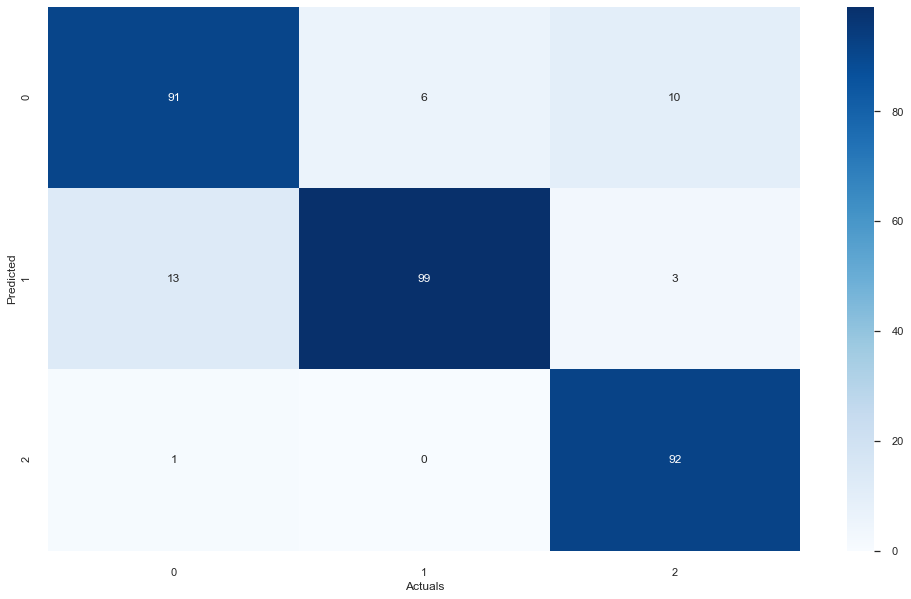

In [144]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_pred_train,Y_train)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Confusion Matrix for Knn with k = 5 on TEST data

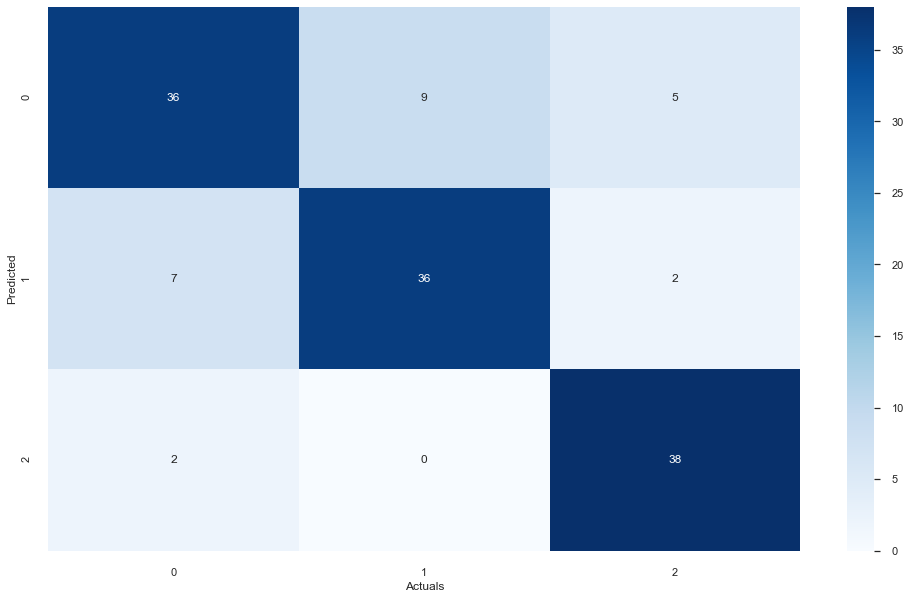

In [145]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_pred_test,Y_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Classification Report

### Classification Report for KNN with k = 5 on training data

In [146]:
print(classification_report(Y_train, Y_pred_train,digits=3))

              precision    recall  f1-score   support

           0      0.850     0.867     0.858       105
           1      0.861     0.943     0.900       105
           2      0.989     0.876     0.929       105

    accuracy                          0.895       315
   macro avg      0.900     0.895     0.896       315
weighted avg      0.900     0.895     0.896       315



### Classification Report for KNN with k = 5 on test data

In [147]:
print(classification_report(Y_test, Y_pred_test,digits=3))

              precision    recall  f1-score   support

           0      0.720     0.800     0.758        45
           1      0.800     0.800     0.800        45
           2      0.950     0.844     0.894        45

    accuracy                          0.815       135
   macro avg      0.823     0.815     0.817       135
weighted avg      0.823     0.815     0.817       135



### We can see a bit of overfitting in almost every metric.

### Automate the task of finding best values of K for KNN.

In [148]:
# creating odd list of K for KNN
myList = list(range(1,20))

# subsetting just the odd ones
neighbors = list(filter(lambda x: x % 2 != 0, myList))

In [149]:
# empty list that will hold accuracy scores
ac_scores = []

# perform accuracy metrics for values from 1,3,5....19
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, Y_train)
    # predict the response
    Y_pred_auto = knn.predict(X_test)
    # evaluate accuracy
    scores = accuracy_score(Y_test, Y_pred_auto)
    ac_scores.append(scores)

# changing to misclassification error
MSE = [1 - x for x in ac_scores]

# determining best k
optimal_k = neighbors[MSE.index(min(MSE))]
print("The optimal number of neighbors is %d" % optimal_k)

The optimal number of neighbors is 1


### Plot misclassification error vs k (with k value on X-axis) using matplotlib.

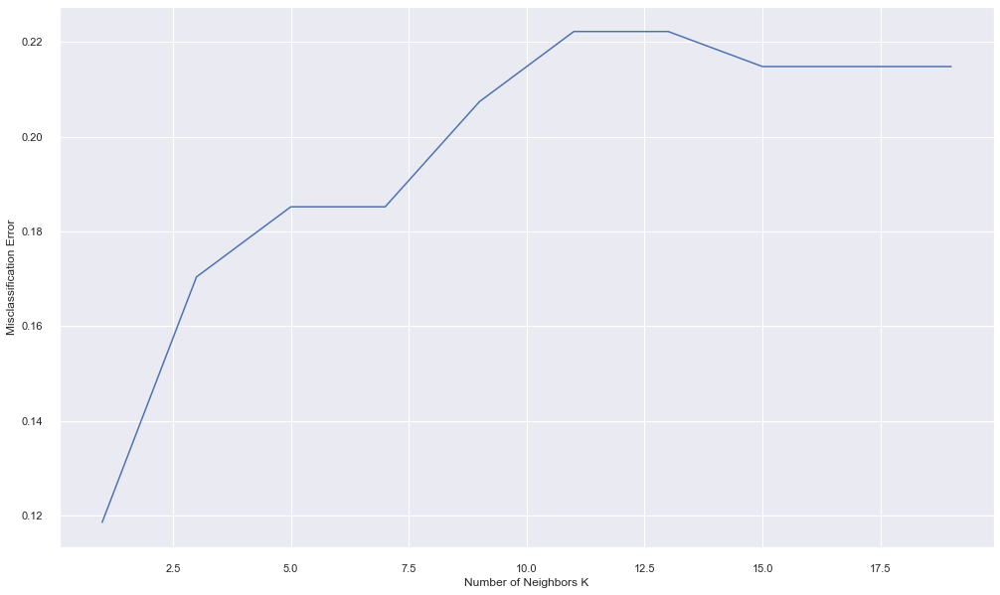

In [152]:
import matplotlib.pyplot as plt
# plot misclassification error vs k
plt.figure(figsize=(15,10))
plt.plot(neighbors, MSE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()

### Since the Misclassification Error is minimum at k = 1, we will not go ahead with this model, as kNN model with k = 1 will and has over fitted the data, as seen. 

===================================================================================================================================================================================

### Support Vector Machine Algorithm.

In [153]:
from sklearn.svm import SVC

In [154]:
SVM=SVC()
SVM.fit(X_train,Y_train)

SVC()

In [155]:
# predict the train and test response
Y_svc_pred_train = SVM.predict(X_train)
Y_svc_pred_test = SVM.predict(X_test)

In [156]:
# evaluate train and test accuracy
print(accuracy_score(Y_train, Y_svc_pred_train))
print(accuracy_score(Y_test, Y_svc_pred_test))

0.8666666666666667
0.8148148148148148


### No overfitting seen here yet!

### Confusion Matrix for Support Vector Machine on TRAIN data

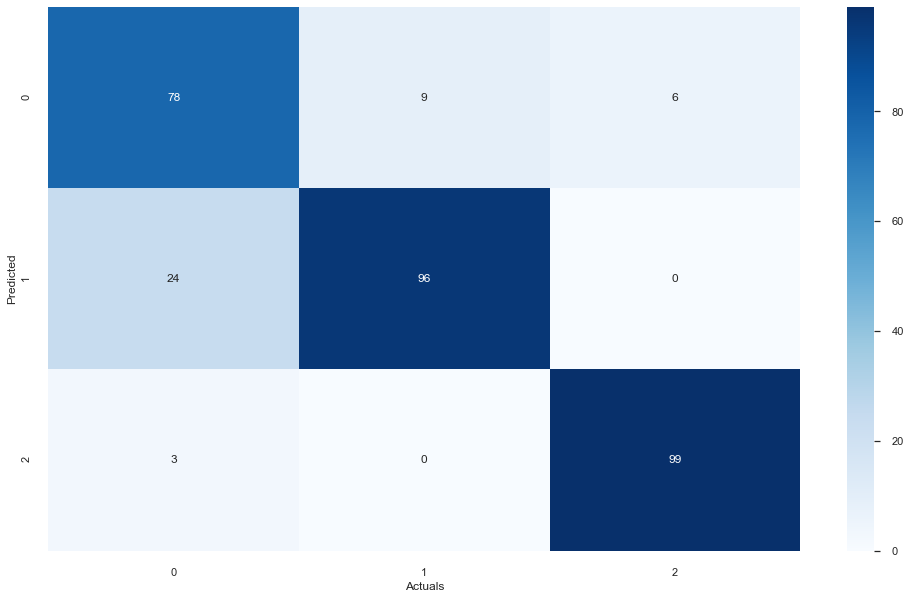

In [157]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_svc_pred_train,Y_train)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Confusion Matrix for Support Vector Machine on TEST data

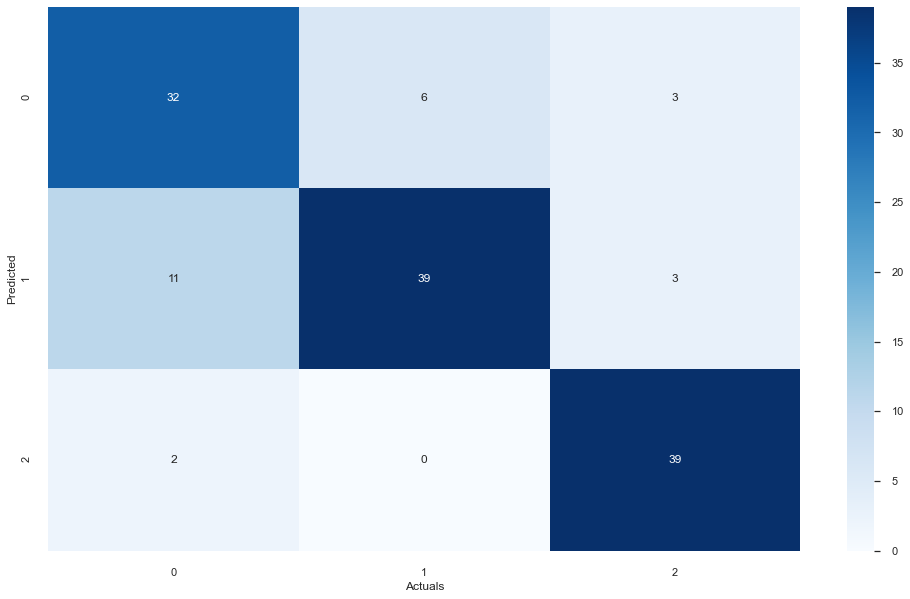

In [158]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_svc_pred_test,Y_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Classification Report for Support Vector Machine on training data

In [159]:
print(classification_report(Y_train, Y_svc_pred_train,digits=3))

              precision    recall  f1-score   support

           0      0.839     0.743     0.788       105
           1      0.800     0.914     0.853       105
           2      0.971     0.943     0.957       105

    accuracy                          0.867       315
   macro avg      0.870     0.867     0.866       315
weighted avg      0.870     0.867     0.866       315



### Classification Report for Support Vector Machine on test data

In [160]:
print(classification_report(Y_test, Y_svc_pred_test,digits=3))

              precision    recall  f1-score   support

           0      0.780     0.711     0.744        45
           1      0.736     0.867     0.796        45
           2      0.951     0.867     0.907        45

    accuracy                          0.815       135
   macro avg      0.823     0.815     0.816       135
weighted avg      0.823     0.815     0.816       135



### Applying Grid Search Cross Validation for Fine Tuning Support Vector Machine

In [162]:
from sklearn.model_selection import GridSearchCV

### Setting up the parameter Grid for Grid Search CV

In [163]:
param_grid={'C':[0.1,1,10,50,100,500], 'gamma':[1,0.5,0.1,0.01,0.001], 'kernel':['poly','rbf','sigmoid']}

In [164]:
## Provided with 10 cross validations to reduce variance of the algorithm.
grid= GridSearchCV(SVM,param_grid, verbose=3, n_jobs=-1, cv=10)

In [165]:
grid.fit(X_train,Y_train)

Fitting 10 folds for each of 90 candidates, totalling 900 fits
[CV 4/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.750 total time=   0.0s
[CV 3/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.781 total time=   0.0s
[CV 2/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.781 total time=   0.0s
[CV 1/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.875 total time=   0.0s
[CV 6/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.774 total time=   0.0s
[CV 5/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.844 total time=   0.0s
[CV 7/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.839 total time=   0.0s
[CV 8/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.613 total time=   0.0s
[CV 9/10] END ......C=0.1, gamma=1, kernel=poly;, score=0.839 total time=   0.0s
[CV 1/10] END .......C=0.1, gamma=1, kernel=rbf;, score=0.781 total time=   0.0s
[CV 10/10] END .....C=0.1, gamma=1, kernel=poly;, score=0.839 total time=   0.0s
[CV 2/10] END .......C=0.1, gamma=1, kernel=rb

GridSearchCV(cv=10, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 50, 100, 500],
                         'gamma': [1, 0.5, 0.1, 0.01, 0.001],
                         'kernel': ['poly', 'rbf', 'sigmoid']},
             verbose=3)

In [166]:
grid.best_params_

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

### Running Support Vector Classifier with the best grid parameters 

In [167]:
SVM=SVC(C = 10, gamma= 0.1, kernel = 'rbf')
SVM.fit(X_train,Y_train)

SVC(C=10, gamma=0.1)

In [168]:
# predict the train and test response by best grid SVC params
Y_svc_pred_train = SVM.predict(X_train)
Y_svc_pred_test = SVM.predict(X_test)

In [169]:
# evaluate train and test accuracy of  best grid SVC params
print(accuracy_score(Y_train, Y_svc_pred_train))
print(accuracy_score(Y_test, Y_svc_pred_test))

0.8793650793650793
0.8222222222222222


### No overfitting seen here yet!

### Confusion Matrix for Support Vector Machine on TRAIN data after predicting with the SVC with best grid params.

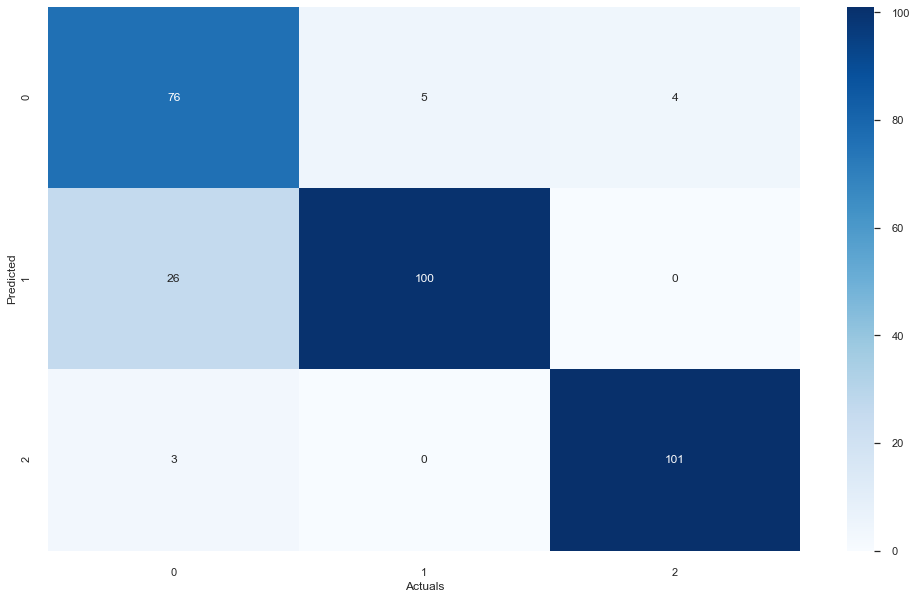

In [170]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_svc_pred_train,Y_train)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Confusion Matrix for Support Vector Machine on TEST data after predicting with the SVC with best grid params.

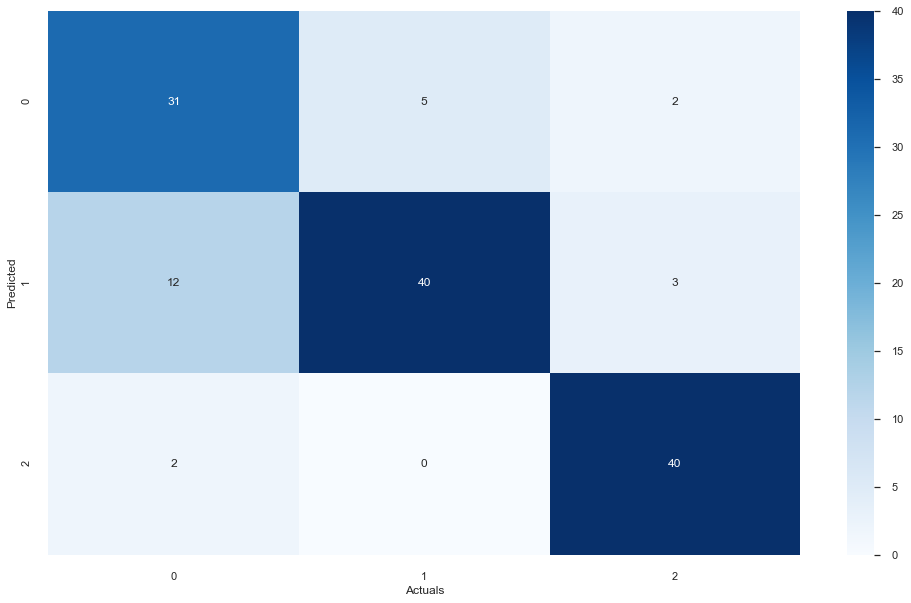

In [171]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_svc_pred_test,Y_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Classification Report for Support Vector Machine with best grid params on training data#

In [172]:
print(classification_report(Y_train, Y_svc_pred_train,digits=3))

              precision    recall  f1-score   support

           0      0.894     0.724     0.800       105
           1      0.794     0.952     0.866       105
           2      0.971     0.962     0.967       105

    accuracy                          0.879       315
   macro avg      0.886     0.879     0.877       315
weighted avg      0.886     0.879     0.877       315



### Classification Report for Support Vector Machine with best grid params on test data

In [173]:
print(classification_report(Y_test, Y_svc_pred_test,digits=3))

              precision    recall  f1-score   support

           0      0.816     0.689     0.747        45
           1      0.727     0.889     0.800        45
           2      0.952     0.889     0.920        45

    accuracy                          0.822       135
   macro avg      0.832     0.822     0.822       135
weighted avg      0.832     0.822     0.822       135



### Best model till now!

======================================================================================================================================================================================

### Logistic Regression - Multinomial Logit using Statsmodels

### Interpretation

### Building the statsmodels Logit 

In [201]:
from statsmodels.discrete.discrete_model import MNLogit
import statsmodels.api as SM

In [202]:
logit_model=MNLogit(Y_train,SM.add_constant(X_train))
logit_model

In [203]:
result=logit_model.fit()
stats1=result.summary()
stats2=result.summary2()

         Current function value: 0.330208
         Iterations: 35


In [204]:
print(stats1)


                          MNLogit Regression Results                          
Dep. Variable:                  class   No. Observations:                  315
Model:                        MNLogit   Df Residuals:                      301
Method:                           MLE   Df Model:                           12
Date:                Wed, 29 Sep 2021   Pseudo R-squ.:                  0.6994
Time:                        12:24:03   Log-Likelihood:                -104.02
converged:                      False   LL-Null:                       -346.06
Covariance Type:            nonrobust   LLR p-value:                 5.364e-96
    class=1       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -2.4450      0.952     -2.567      0.010      -4.312      -0.578
P_incidence    -0.0056        nan        nan        nan         nan         nan
P_tilt          1.6896        nan        nan    

### Interpretation of Statsmodels Multinomial logit stats #1.

As we cann see from the p values of class 1, L_angle and P_radius are significant contributors to the log odds for class 1. For class 2, only S_Degree contributes to the log odds of this class.

In [205]:
print(stats2)

                        Results: MNLogit
Model:              MNLogit          Pseudo R-squared: 0.699     
Dependent Variable: class            AIC:              236.0307  
Date:               2021-09-29 12:24 BIC:              288.5668  
No. Observations:   315              Log-Likelihood:   -104.02   
Df Model:           12               LL-Null:          -346.06   
Df Residuals:       301              LLR p-value:      5.3636e-96
Converged:          0.0000           Scale:            1.0000    
No. Iterations:     35.0000                                      
-----------------------------------------------------------------
 class = 0    Coef.   Std.Err.     t     P>|t|    [0.025   0.975]
-----------------------------------------------------------------
      const  -2.4450    0.9524  -2.5672  0.0103  -4.3116  -0.5784
P_incidence  -0.0056       nan      nan     nan      nan      nan
     P_tilt   1.6896       nan      nan     nan      nan      nan
    L_angle  -1.6081    0.6176  -2.

### Interpretation of Statsmodels Multinomial logit stats #2.

As we can see from the p values of class 0, L_angle and P_radius are significant contributors to the log odds for class 1. 

### Note:- Some of the p-values have appeared to be nan in the MNlogit summary report. Further analysis needs to be conducted to arrive at the reason for this behaviour.

### Multinomial Logistic Regression using sklearn.

In [206]:
from sklearn.linear_model import LogisticRegression

In [207]:
model_LR1 = LogisticRegression(random_state=0, multi_class='multinomial', penalty='none', solver='newton-cg').fit(X_train, Y_train)
preds = model_LR1.predict(X_test)

In [209]:
#print the tunable parameters 
params = model_LR1.get_params()
print(params)

{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'multinomial', 'n_jobs': None, 'penalty': 'none', 'random_state': 0, 'solver': 'newton-cg', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


In [211]:
#Print model parameters
print('Intercept: \n', model_LR1.intercept_)
print('Coefficients: \n', model_LR1.coef_)

Intercept: 
 [ 0.03178252 -2.41320816  2.38142564]
Coefficients: 
 [[-0.12738029 -0.595154    0.7259363   0.28018147  0.89970299 -2.83456207]
 [-0.34164169  1.21555864 -0.88219563 -1.34502636 -1.08856604 -3.88972661]
 [ 0.46902199 -0.62040464  0.15625933  1.06484489  0.18886305  6.72428868]]


### In this solution, there is an equation for each class. 

These act as independent binary logistic regression models. The actual output is log(p(y=c)/1 - p(y=c)), which are multinomial logit coefficients, hence the three equations.  After exponentiating each regressor coefficient, we in fact get odds ratios.

The interpretation of the coefficients is for a single unit change in the predictor variable, the log of odds will change by a factor indicated by the beta coefficient, given that all other variables are held constant.  


### Log of odds is not really meaningful, so exponentiating the output gets a slightly more user interpretable output: 

In [213]:
#Calculate odds ratio estimates

np.exp(model_LR1.coef_)

array([[8.80398798e-01, 5.51477632e-01, 2.06666522e+00, 1.32336994e+00,
        2.45887270e+00, 5.87442460e-02],
       [7.10602772e-01, 3.37217736e+00, 4.13873200e-01, 2.60532841e-01,
        3.36698962e-01, 2.04509363e-02],
       [1.59843015e+00, 5.37726810e-01, 1.16912935e+00, 2.90038907e+00,
        1.20787552e+00, 8.32379680e+02]])

### Now we come to the predictions!

In [214]:
# predict the train and test response 

Y_LR_pred_train = model_LR1.predict(X_train)
Y_LR_pred_test = model_LR1.predict(X_test)

In [215]:
# evaluate train and test accuracy of  best grid SVC params

print(accuracy_score(Y_train, Y_LR_pred_train))
print(accuracy_score(Y_test, Y_LR_pred_test))

0.8571428571428571
0.8518518518518519


### Best Generalized Model yet!!

### Confusion Matrix for Logistic Regression on TRAIN data.

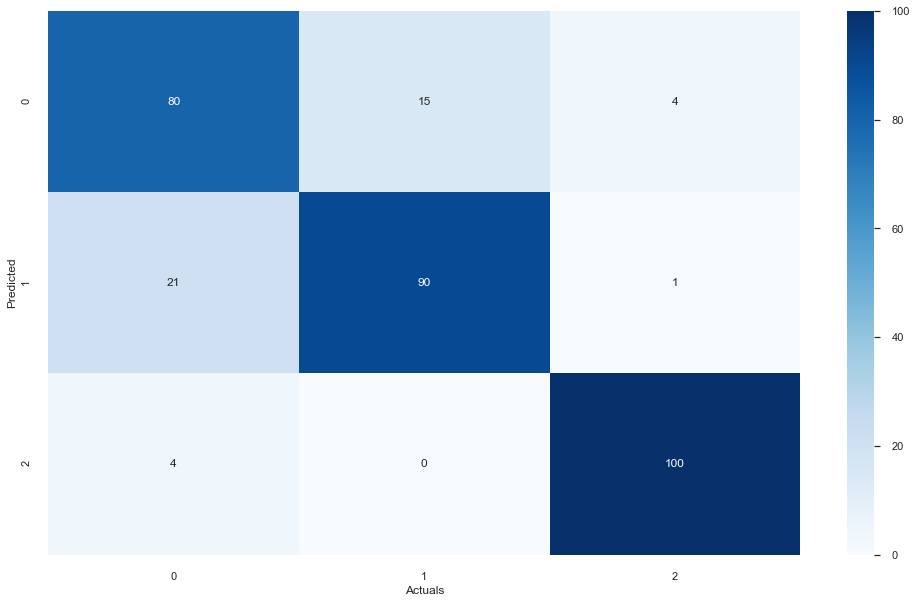

In [216]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_LR_pred_train,Y_train)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Confusion Matrix for Logistic Regression on TEST data.

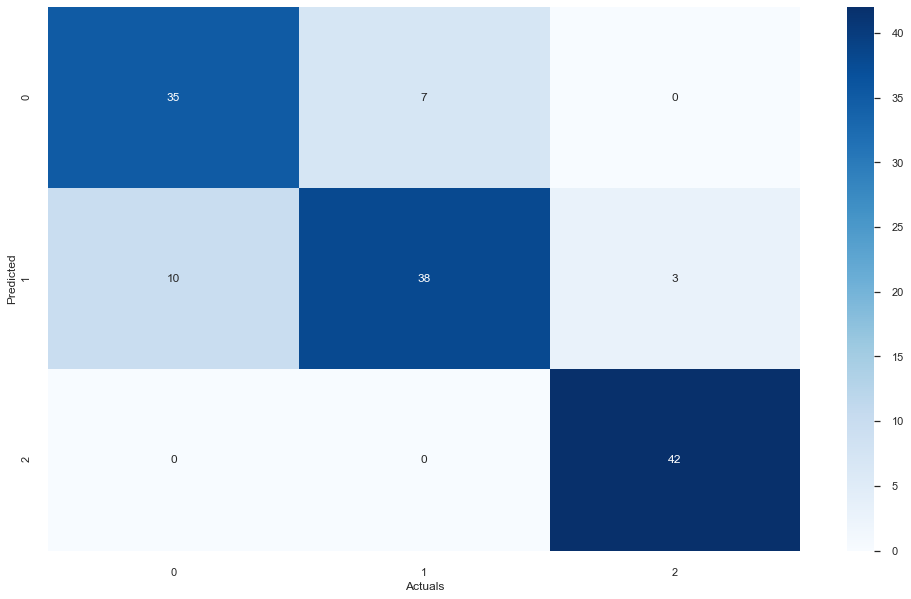

In [217]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_LR_pred_test,Y_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Classification Report for Logistic Regression on training data

In [218]:
print(classification_report(Y_train, Y_LR_pred_train,digits=3))

              precision    recall  f1-score   support

           0      0.808     0.762     0.784       105
           1      0.804     0.857     0.829       105
           2      0.962     0.952     0.957       105

    accuracy                          0.857       315
   macro avg      0.858     0.857     0.857       315
weighted avg      0.858     0.857     0.857       315



### Classification Report for Logistic Regression  on test data

In [219]:
print(classification_report(Y_test, Y_LR_pred_test,digits=3))

              precision    recall  f1-score   support

           0      0.833     0.778     0.805        45
           1      0.745     0.844     0.792        45
           2      1.000     0.933     0.966        45

    accuracy                          0.852       135
   macro avg      0.859     0.852     0.854       135
weighted avg      0.859     0.852     0.854       135



===================================================================================================================================================================================

### Applying Randomized Search Cross Validation for Fine Tuning Multinomial Logistic Regression

In [225]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform

In [231]:
## Setting up the Repeated Stratified K fold cross validations

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

In [232]:
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)

In [233]:
## Instantiating the LR model

model_LR2 = LogisticRegression(random_state = 42, multi_class='multinomial')

In [234]:
search = RandomizedSearchCV(model_LR2, space, n_iter=500, scoring='accuracy', n_jobs=-1, cv=cv, random_state=42)

In [230]:
# execute search   

warnings.filterwarnings('ignore')
result = search.fit(X_train, Y_train)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1322: UserWarning: Setting penalt

In [235]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.8550067204301075
Best Hyperparameters: {'C': 61.259047279891696, 'penalty': 'l2', 'solver': 'newton-cg'}


### Creating the Logistic Regression Model with the best Hyperparameters from Random Search CV.

The reason we are going for randomizedsearch CV here over Grid search CV is because we have more number of parameters here and hence the time taken by Grid search will be much higher than Randomized Search CV.

In [236]:
model_LR3 = LogisticRegression(random_state = 42, multi_class='multinomial',C = 61.259047279891696, penalty = 'l2', solver =  'newton-cg')

In [238]:
# Fitting the model with data
model_LR3.fit(X_train, Y_train)

LogisticRegression(C=61.259047279891696, multi_class='multinomial',
                   random_state=42, solver='newton-cg')

In [239]:
# predict the train and test response 

Y_LR3_pred_train = model_LR3.predict(X_train)
Y_LR3_pred_test = model_LR3.predict(X_test)

In [240]:
# evaluate train and test accuracy of best hyperparms of LR

print(accuracy_score(Y_train, Y_LR3_pred_train))
print(accuracy_score(Y_test, Y_LR3_pred_test))

0.8603174603174604
0.8518518518518519


### Classification Report for Logistic Regression with best hyper params on training data

In [241]:
print(classification_report(Y_train, Y_LR3_pred_train,digits=3))

              precision    recall  f1-score   support

           0      0.816     0.762     0.788       105
           1      0.805     0.867     0.835       105
           2      0.962     0.952     0.957       105

    accuracy                          0.860       315
   macro avg      0.861     0.860     0.860       315
weighted avg      0.861     0.860     0.860       315



### Classification Report for Logistic Regression with best hyper params on test data

In [242]:
print(classification_report(Y_test, Y_LR3_pred_test,digits=3))

              precision    recall  f1-score   support

           0      0.833     0.778     0.805        45
           1      0.745     0.844     0.792        45
           2      1.000     0.933     0.966        45

    accuracy                          0.852       135
   macro avg      0.859     0.852     0.854       135
weighted avg      0.859     0.852     0.854       135



### Confusion Matrix for Logistic Regression with best hyperparm on TRAIN data.

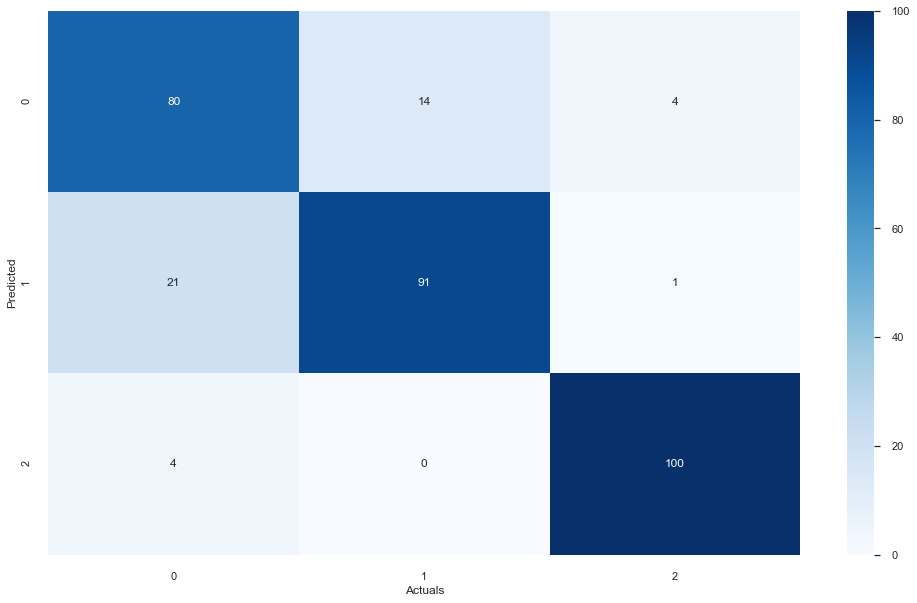

In [243]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_LR3_pred_train,Y_train)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

### Confusion Matrix for Logistic Regression with best hyperparm on TEST data.

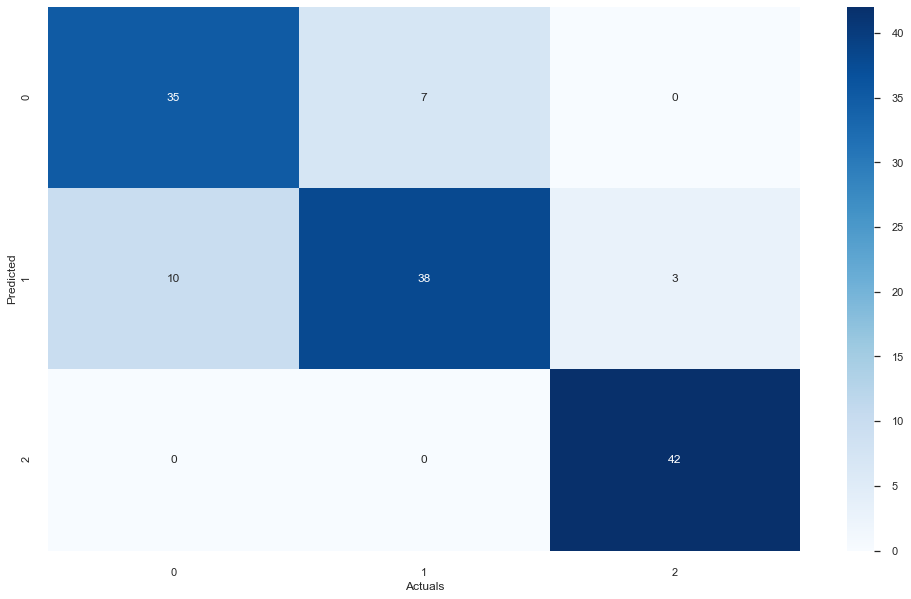

In [244]:
plt.figure(figsize=(15,10))
sns.heatmap((confusion_matrix(Y_LR3_pred_test,Y_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.ylabel('Predicted');
plt.xlabel('Actuals',rotation=0);

## 6. Conclusion

### The final model selected for this medical problem statement is Logistic regression with hyper parameters. The reason is that 

### * This model gives a slightly better accuracy here as compared the vanilla sklearn Logistic regression fitted just before. 
### * The LR model with hyper paramters also has generalized well (Minimum difference between train and test accuracies). Sinve we have introduced cross validations in the Random search, we can expect lower variances from this model.
### * The hyper parm tuned Support Vector machine has also performed well, however there is a slight difference between train and test accuracies.

### Suggestions and Improvements

#### * Type_S class patients condition is critical and should be positively be taken action . 
#### * There number of patients with high S_degree attribute should be reduced.
#### * There number of patients with high P_tilt attribute should be reduced.
#### * There number of patients with high P_radius attribute should be reduced.
#### * The patients with high P_incidence is less and can thus be controlled.  
#### * S_degree attribute of Type_S class should be reduced as it is for Normal and Type_H class.